In [1]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('/content/drive/MyDrive/data/data.csv')
genre_data = pd.read_csv('/content/drive/MyDrive/data/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/data/data_by_year.csv')
artist_data=pd.read_csv('/content/drive/MyDrive/data/data_by_artist.csv')



In [3]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [4]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [5]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [6]:
print(artist_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              28680 non-null  int64  
 1   count             28680 non-null  int64  
 2   acousticness      28680 non-null  float64
 3   artists           28680 non-null  object 
 4   danceability      28680 non-null  float64
 5   duration_ms       28680 non-null  float64
 6   energy            28680 non-null  float64
 7   instrumentalness  28680 non-null  float64
 8   liveness          28680 non-null  float64
 9   loudness          28680 non-null  float64
 10  speechiness       28680 non-null  float64
 11  tempo             28680 non-null  float64
 12  valence           28680 non-null  float64
 13  popularity        28680 non-null  float64
 14  key               28680 non-null  int64  
dtypes: float64(11), int64(3), object(1)
memory usage: 3.3+ MB
None


<Axes: xlabel='decade', ylabel='count'>

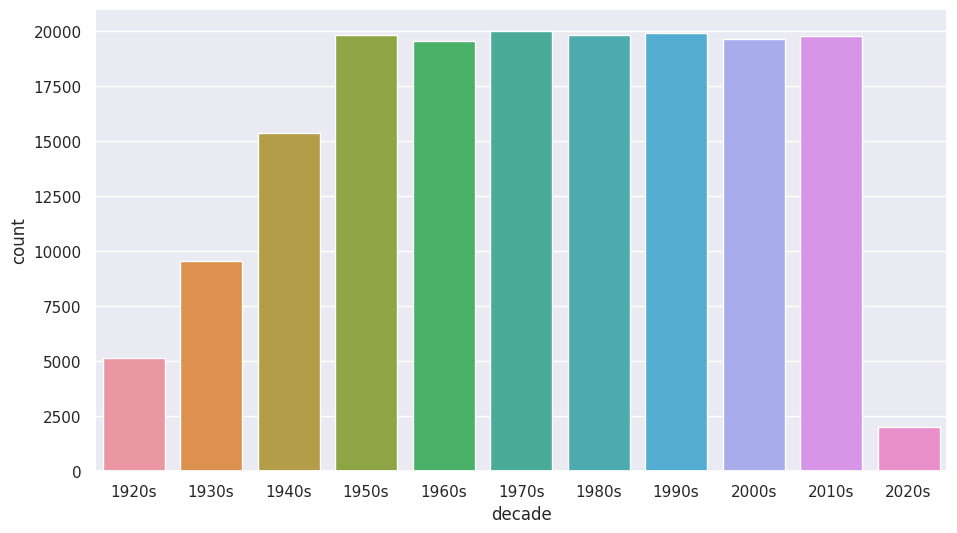

In [7]:


# Assuming 'data' is your DataFrame containing the 'year' column
def get_decade(year):
    period_start = int(year / 10) * 10
    decade = f'{period_start}s'
    return decade

data['decade'] = data['year'].apply(get_decade)

# Convert 'decade' to categorical data
data['decade'] = pd.Categorical(data['decade'], ordered=True)

sns.set(rc={'figure.figsize': (11, 6)})
sns.countplot(data=data, x='decade')

In [8]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [9]:
top_artists_by_popularity = artist_data.groupby('artists')['popularity'].max().nlargest(10)

# Reset index to make the artist names accessible for plotting
top_artists_by_popularity = top_artists_by_popularity.reset_index()

# Create a bar plot using Plotly Express
fig = px.bar(top_artists_by_popularity, x='artists', y='popularity',
             labels={'artists': 'Artists', 'popularity': 'Popularity Score'},
             title='Top 10 Artists by Popularity')
fig.show()



In [10]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [11]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.354s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106262
[t-SNE] KL divergence after 1000 iterations: 1.394035


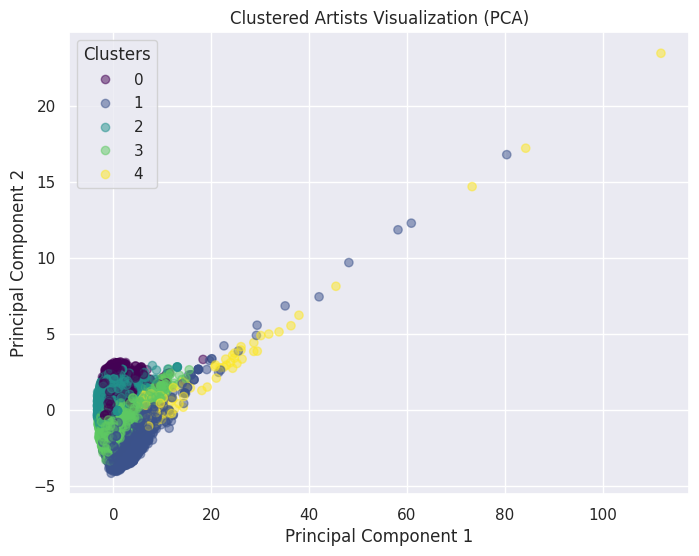

In [12]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
# Assuming 'artist_data' is your DataFrame with features of artists for clustering
# 'X' represents the numerical features of artists for clustering

# Selecting numerical features for clustering (replace 'X' with actual numerical columns)
X = artist_data.select_dtypes(include='number')

# Handling missing values if any
X.fillna(0, inplace=True)  # Replace NaNs with 0 or choose an appropriate imputation strategy

# Create a pipeline for scaling, KMeans clustering, and PCA
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=5, random_state=42)),
    ('pca', PCA(n_components=2))
])

# Fit the pipeline to the data and transform for visualization
artist_pca = pipeline.fit_transform(X)

# Creating a DataFrame for the PCA results with cluster labels
pca_df = pd.DataFrame(data=artist_pca, columns=['PC1', 'PC2'])
pca_df['Cluster'] = pipeline.named_steps['kmeans'].labels_

# Visualizing the clustered artists using PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Cluster'], cmap='viridis', alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clustered Artists Visualization (PCA)')
plt.legend(*scatter.legend_elements(), title='Clusters')
plt.show()

In [13]:
# Assuming 'data' is your DataFrame containing numerical columns
X = data.select_dtypes(np.number)

# Impute missing values using mean imputation
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Define the pipeline with imputation, scaling, and clustering
song_cluster_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=10))
])

# Fit the pipeline to the imputed data
song_cluster_pipeline.fit(X_imputed)

# Predict cluster labels for the imputed data
song_cluster_labels = song_cluster_pipeline.predict(X_imputed)

# Assign cluster labels to the DataFrame
data['cluster_label'] = song_cluster_labels

In [14]:
from sklearn.decomposition import PCA
# Assuming 'data' is your DataFrame containing columns with potential NaNs
X = data.select_dtypes(include=np.number)  # Select only numeric columns

# Check for missing values (NaN) in the selected numeric columns
missing_values = X.isnull().sum()
if missing_values.sum() > 0:
    # If missing values exist, handle them using imputation (replace NaNs with mean values)
    imputer = SimpleImputer(strategy='mean')
    X_imputed = imputer.fit_transform(X)
else:
    X_imputed = X.values  # No missing values, proceed with the original data

# Define the PCA pipeline with scaling
pca_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('PCA', PCA(n_components=2))
])

# Fit and transform the imputed data using PCA
song_embedding = pca_pipeline.fit_transform(X_imputed)

# Create a DataFrame for the PCA results
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [15]:
!pip install spotipy

In [16]:
import os
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="e8129135a3ea4c1fae43e89740eff1ea", client_secret="56441c7b43094896bb602060dc7b8127"))
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [17]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=60):

    metadata_cols = ['year', 'name','artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [18]:
recommendations=recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  data)
for song in recommendations:
    print(song)

{'year': 2014, 'name': 'Porn Star', 'artists': "['August Alsina']"}
{'year': 2012, 'name': 'Dirty Paws', 'artists': "['Of Monsters and Men']"}
{'year': 1996, 'name': "100 Miles And Runnin'", 'artists': "['N.W.A.']"}
{'year': 1990, 'name': 'Jealous Again', 'artists': "['The Black Crowes']"}
{'year': 2016, 'name': 'Overtime', 'artists': "['ScHoolboy Q', 'Miguel', 'Justine Skye']"}
{'year': 1981, 'name': 'Corazón de Poeta', 'artists': "['Jeanette']"}
{'year': 1980, 'name': 'Il jouait du piano debout - Remasterisé en 2004', 'artists': "['France Gall']"}
{'year': 2003, 'name': 'Zoe Jane', 'artists': "['Staind']"}
{'year': 1997, 'name': 'La Ciguapa', 'artists': "['ChiChi Peralta']"}
{'year': 2009, 'name': 'Rye Whiskey / Time to Switch to Whiskey', 'artists': "['Corb Lund']"}
{'year': 1983, 'name': "Foolin'", 'artists': "['Def Leppard']"}
{'year': 1989, 'name': 'Elimination', 'artists': "['Overkill']"}
{'year': 2013, 'name': 'Meet Me In the City', 'artists': "['North Mississippi Allstars']"}


In [22]:
from flask import Flask, redirect, request
from spotipy.oauth2 import SpotifyOAuth


app = Flask(__name__)

# Replace with yourSpotify application's credentials and redirect URI
client_id='e8129135a3ea4c1fae43e89740eff1ea',
client_secret='56441c7b43094896bb602060dc7b8127',
redirect_uri= 'https://developer.spotify.com'

# Scopes needed for your application
scopes = "user-library-read playlist-read-private playlist-modify-private"

@app.route('/spotify_auth')
def spotify_auth():
    sp_oauth = SpotifyOAuth(client_id=client_id, client_secret=client_secret, redirect_uri=redirect_uri, scope=scopes)

    # Check if the authorization code is present in the request
    if 'code' in request.args:
        code = request.args['code']
        token_info = sp_oauth.get_access_token(code)

        # Use token_info to make Spotify API requests
        # token_info contains the access token and its expiration details
        # For demonstration, returning the access token as a response
        return f"Authentication successful! Access token: {token_info['access_token']}"
    else:
        # Redirect to Spotify authorization page if no code is present
        return redirect(sp_oauth.get_authorize_url())

if __name__ == '__main__':
    app.run(debug=True)

 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat


In [23]:
import os
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth

#sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="e8129135a3ea4c1fae43e89740eff1ea", client_secret="56441c7b43094896bb602060dc7b8127"))
scope = "playlist-modify-private"  # Adjust the scope as needed

sp = spotipy.Spotify(auth_manager=SpotifyOAuth(client_id='e8129135a3ea4c1fae43e89740eff1ea',
                                               client_secret='56441c7b43094896bb602060dc7b8127',
                                               redirect_uri='https://developer.spotify.com',
                                               scope=scope))
# Assuming 'recommendations' is the list of recommended songs as dictionaries
# Create a new playlist
playlist_name = 'Recommended Songs'
playlist = sp.user_playlist_create(sp.me()['id'], playlist_name, public=False)

# Extract track URIs from recommended songs
track_uris = [f"spotify:track:{song['track_id']}" for song in recommendations]

# Add tracks to the created playlist
sp.user_playlist_add_tracks(sp.me()['id'], playlist['id'], track_uris)

Enter the URL you were redirected to: https://developer.spotify.com


SpotifyOauthError: ignored

# New Section